# BNT Transform Example Workflow

This notebook demonstrates the complete workflow for processing weak lensing convergence (kappa) maps using the BNT (Bin Nulling Transform) technique:

1. Load example kappa maps at 4 different redshift bins
2. Add realistic shape noise
3. Apply the BNT transformation
4. Visualize original and BNT-transformed maps
5. Calculate auto and cross power spectra
6. Visualize the power spectra

The BNT transform is designed to create decorrelated redshift bins that can help separate cosmological signals from systematic effects.

## 1. Import Required Libraries

In [1]:
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import h5py
import os
from itertools import combinations

# Set plotting style
plt.style.use('default')
%matplotlib inline

## 2. Define Helper Functions

We'll define functions for:
- Adding shape noise to maps
- The BNT transformation matrix
- Computing power spectra

In [2]:
# BNT transformation matrix
# This matrix transforms the original 4 redshift bins into decorrelated BNT bins
BNT_MATRIX = np.array([[ 1.        ,  0.        ,  0.        ,  0.        ],
                       [-1.        ,  1.        ,  0.        ,  0.        ],
                       [ 0.4521097 , -1.4521097 ,  1.        ,  0.        ],
                       [ 0.        ,  0.25127807, -1.251278  ,  1.        ]])

def add_shape_noise(kg, sigma_e=0.26, galaxy_density=6.75, nside=512):
    """
    Adds shape noise to a full-sky Healpix convergence (kappa) map.
    
    Parameters:
    - kg: HEALPix convergence map
    - sigma_e: intrinsic ellipticity dispersion (default: 0.26)
    - galaxy_density: galaxy surface density in arcmin^-2 (default: 6.75)
    - nside: HEALPix resolution parameter
    
    Returns:
    - Noisy convergence map
    """
    npix = hp.nside2npix(nside)
    pixel_area_arcmin2 = hp.nside2pixarea(nside, degrees=True) * 3600
    sigma_pix = sigma_e / np.sqrt(galaxy_density * pixel_area_arcmin2)
    noise = np.random.normal(loc=0, scale=sigma_pix, size=npix)
    return kg + noise

def get_cross_power_spectra(maps_dict, lmax=1024):
    """
    Computes auto and cross power spectra for multiple maps.
    
    Parameters:
    - maps_dict: dict, dictionary with bin numbers as keys and HEALPix maps as values
    - lmax: int, the maximum multipole to compute
    
    Returns:
    - cls_dict: dict, dictionary with (bin_i, bin_j) tuples as keys and Cls as values
    """
    # Convert all maps to alms first
    alms_dict = {}
    for bin_num, map_data in maps_dict.items():
        alms_dict[bin_num] = hp.map2alm(map_data, lmax=lmax)
    
    # Compute all auto and cross power spectra
    cls_dict = {}
    bin_numbers = sorted(maps_dict.keys())
    
    # Auto power spectra (diagonal elements)
    for bin_num in bin_numbers:
        cls_dict[(bin_num, bin_num)] = hp.alm2cl(alms_dict[bin_num])
    
    # Cross power spectra (off-diagonal elements)
    for bin_i, bin_j in combinations(bin_numbers, 2):
        cls_dict[(bin_i, bin_j)] = hp.alm2cl(alms_dict[bin_i], alms_dict[bin_j])
    
    return cls_dict

print("BNT Matrix:")
print(BNT_MATRIX)
print("\nHelper functions defined successfully!")

BNT Matrix:
[[ 1.          0.          0.          0.        ]
 [-1.          1.          0.          0.        ]
 [ 0.4521097  -1.4521097   1.          0.        ]
 [ 0.          0.25127807 -1.251278    1.        ]]

Helper functions defined successfully!


## 3. Load or Generate Example Maps

For this example, we'll either:
- Load maps from an existing HDF5 file (if available)
- Generate synthetic example maps (if no data file exists)

The maps represent weak lensing convergence (kappa) at 4 different redshift bins.

In [3]:
# Try to load from an example file, otherwise generate synthetic maps
nside = 512
npix = hp.nside2npix(nside)

# Example path - adjust this to point to your data
example_file = "/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_nobaryons512.h5"

kgs_original = []

if os.path.exists(example_file):
    print(f"Loading maps from: {example_file}")
    with h5py.File(example_file, "r") as f:
        for i in range(4):
            map_key = f"kg/stage3_lensing{i+1}"
            kgs_original.append(np.array(f[map_key]))
    print("✓ Successfully loaded 4 kappa maps from file")
else:
    print("Data file not found. Generating synthetic example maps...")
    # Generate synthetic maps with some correlation structure
    np.random.seed(42)
    lmax = 1024
    for i in range(4):
        # Generate random alms with power spectrum roughly ~ l^-2
        ell = np.arange(lmax + 1)
        cl = 1e-6 / (1 + ell)**2
        cl[0:2] = 0  # Remove monopole and dipole
        
        # Generate random map from this power spectrum
        kg_synth = hp.synfast(cl, nside, lmax=lmax, verbose=False)
        kgs_original.append(kg_synth)
    print("✓ Generated 4 synthetic kappa maps")

kgs_original = np.array(kgs_original)
print(f"\nOriginal maps shape: {kgs_original.shape}")
print(f"Map statistics:")
for i in range(4):
    print(f"  Bin {i+1}: mean = {np.mean(kgs_original[i]):.2e}, std = {np.std(kgs_original[i]):.2e}")

Loading maps from: /home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_nobaryons512.h5
✓ Successfully loaded 4 kappa maps from file

Original maps shape: (4, 3145728)
Map statistics:
  Bin 1: mean = 7.55e-03, std = 2.75e-03
  Bin 2: mean = 1.64e-02, std = 4.64e-03
  Bin 3: mean = 3.61e-02, std = 7.37e-03
  Bin 4: mean = 5.44e-02, std = 8.91e-03


## 4. Visualize Original Kappa Maps

Let's visualize the original convergence maps at each redshift bin before adding noise.

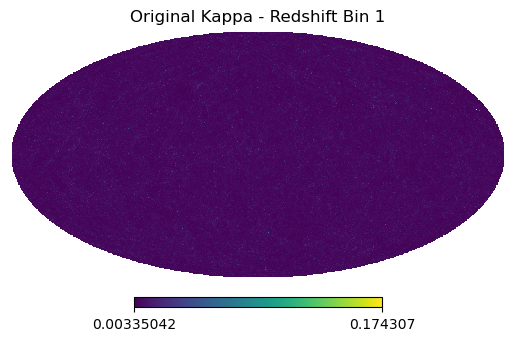

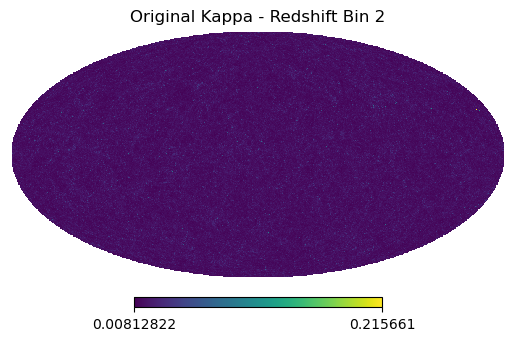

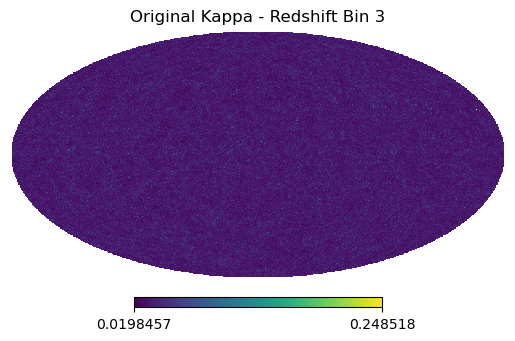

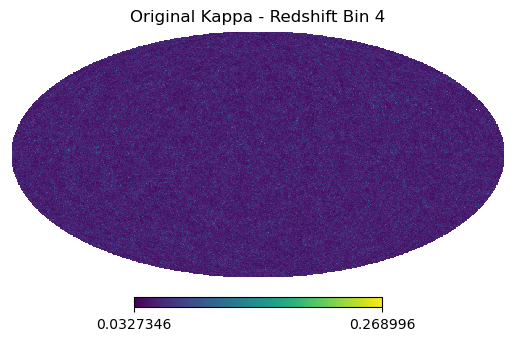

<Figure size 640x480 with 0 Axes>

In [4]:
for i in range(4):    
    hp.mollview(kgs_original[i], sub=(2, 2, i+1), title=f'Original Kappa - Redshift Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.show()
    
plt.suptitle('Original Convergence Maps (No Noise)', fontsize=16, y=0.98)
plt.tight_layout()
# plt.show()

## 5. Add Shape Noise to Maps

We add realistic shape noise to simulate observational conditions. The noise level depends on:
- **σ_e = 0.26**: intrinsic ellipticity dispersion
- **n_gal = 6.75 arcmin⁻²**: galaxy surface density

In [5]:
# Add shape noise to each map
np.random.seed(42)  # For reproducibility
sigma_e = 0.26
galaxy_density = 6.75

kgs_noisy = []
for i, kg in enumerate(kgs_original):
    kg_noisy = add_shape_noise(kg, sigma_e=sigma_e, galaxy_density=galaxy_density, nside=nside)
    kgs_noisy.append(kg_noisy)
    
kgs_noisy = np.array(kgs_noisy)

print("✓ Added shape noise to all maps")
print(f"\nNoisy maps statistics:")
for i in range(4):
    print(f"  Bin {i+1}: mean = {np.mean(kgs_noisy[i]):.2e}, std = {np.std(kgs_noisy[i]):.2e}")

✓ Added shape noise to all maps

Noisy maps statistics:
  Bin 1: mean = 7.54e-03, std = 1.48e-02
  Bin 2: mean = 1.64e-02, std = 1.53e-02
  Bin 3: mean = 3.61e-02, std = 1.63e-02
  Bin 4: mean = 5.44e-02, std = 1.71e-02


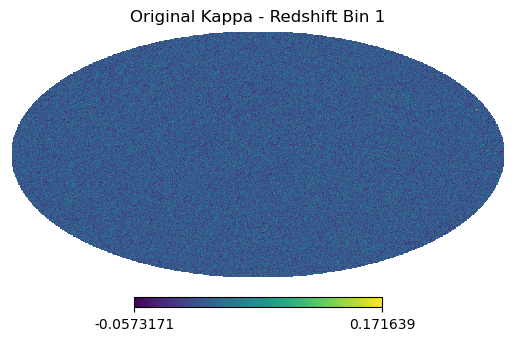

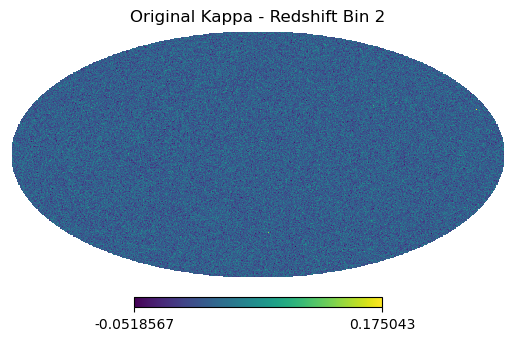

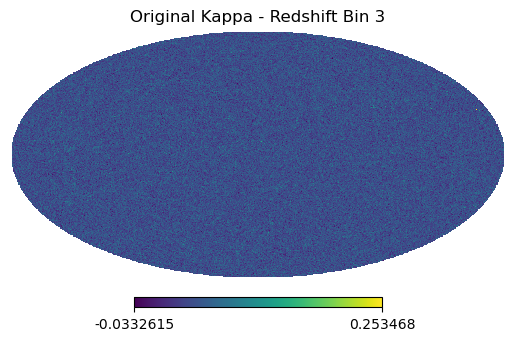

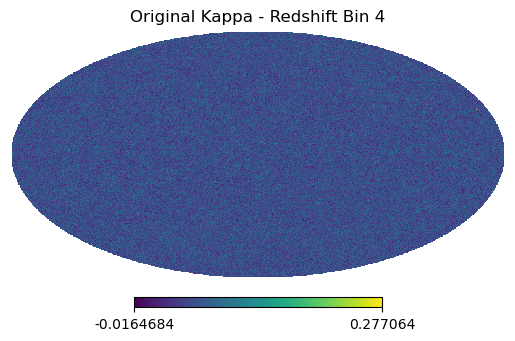

<Figure size 640x480 with 0 Axes>

In [6]:
for i in range(4):    
    hp.mollview(kgs_noisy[i], sub=(2, 2, i+1), title=f'Original Kappa - Redshift Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.show()
    
plt.suptitle('Original Convergence Maps (No Noise)', fontsize=16, y=0.98)
plt.tight_layout()
# plt.show()

## 6. Apply BNT Transform

The BNT (Bin Nulling Transform) creates decorrelated redshift bins from the original 4 bins. The transformation is:

**BNT₁** = κ₁  
**BNT₂** = κ₂ - κ₁  
**BNT₃** = κ₃ - 1.452·κ₂ + 0.452·κ₁  
**BNT₄** = κ₄ - 1.251·κ₃ + 0.251·κ₂  

This helps separate low-z and high-z information and can improve constraints on cosmological parameters.

In [7]:
# Apply BNT transform to noisy maps
kgs_bnt = BNT_MATRIX @ kgs_noisy

print("✓ Applied BNT transformation")
print(f"\nBNT maps shape: {kgs_bnt.shape}")
print(f"\nBNT maps statistics:")
for i in range(4):
    print(f"  BNT Bin {i+1}: mean = {np.mean(kgs_bnt[i]):.2e}, std = {np.std(kgs_bnt[i]):.2e}")

✓ Applied BNT transformation

BNT maps shape: (4, 3145728)

BNT maps statistics:
  BNT Bin 1: mean = 7.54e-03, std = 1.48e-02
  BNT Bin 2: mean = 8.84e-03, std = 2.07e-02
  BNT Bin 3: mean = 1.57e-02, std = 2.66e-02
  BNT Bin 4: mean = 1.34e-02, std = 2.37e-02


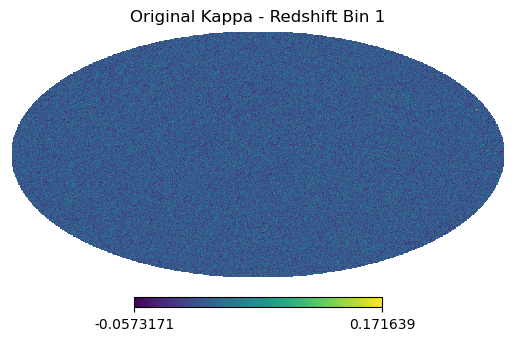

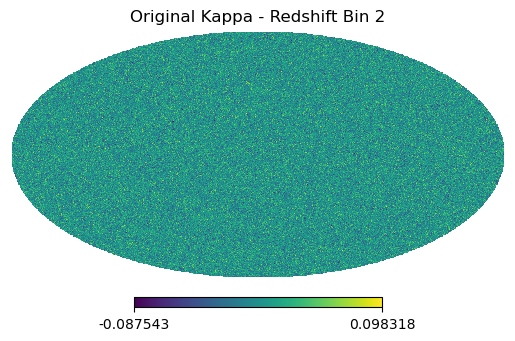

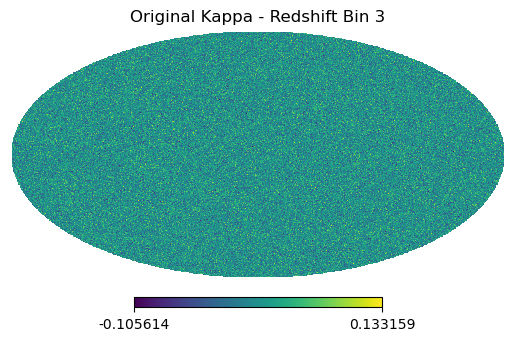

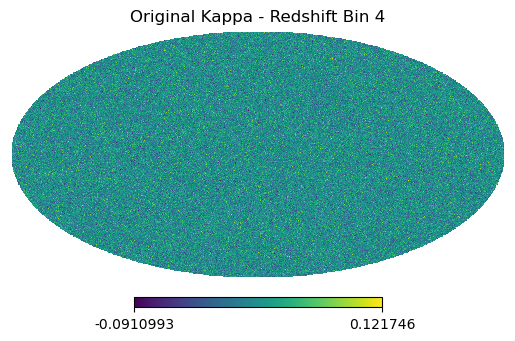

<Figure size 640x480 with 0 Axes>

In [8]:
for i in range(4):    
    hp.mollview(kgs_bnt[i], sub=(2, 2, i+1), title=f'Original Kappa - Redshift Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.show()
    
plt.suptitle('Original Convergence Maps (No Noise)', fontsize=16, y=0.98)
plt.tight_layout()
# plt.show()

## 7. Visualize BNT-Transformed Maps

Let's compare the noisy original maps with the BNT-transformed maps.

/tmp/ipykernel_1840724/3168815827.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


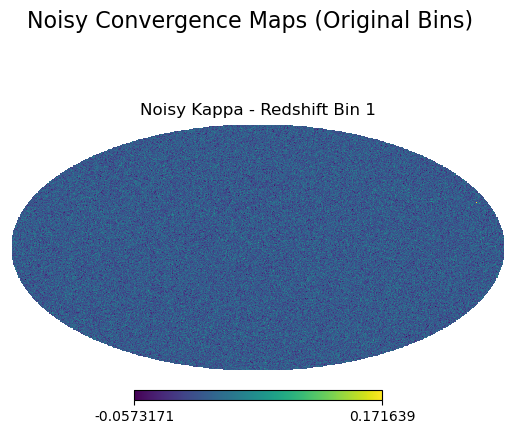

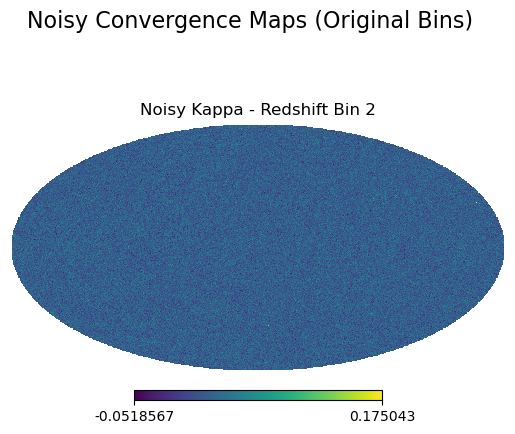

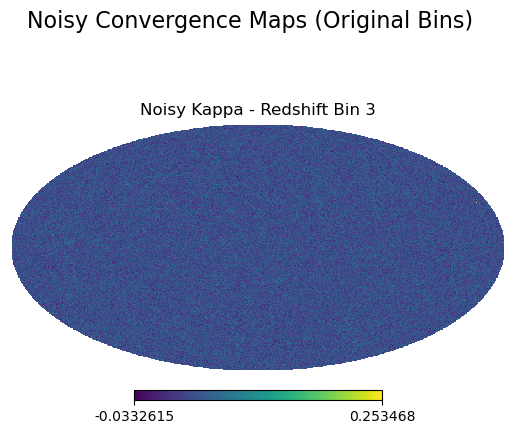

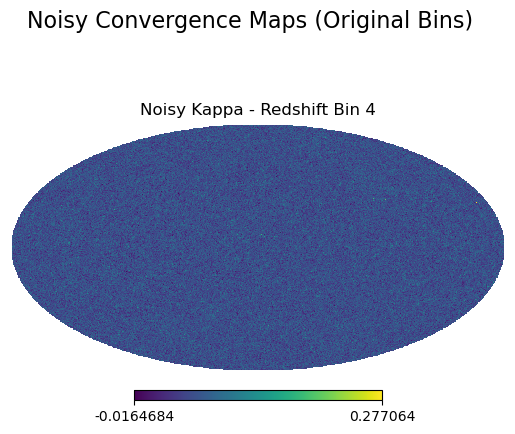

/tmp/ipykernel_1840724/3168815827.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


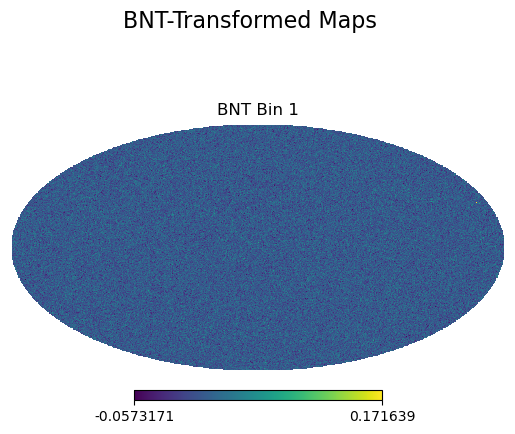

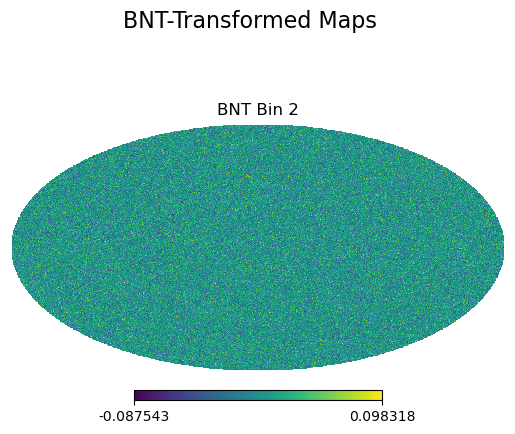

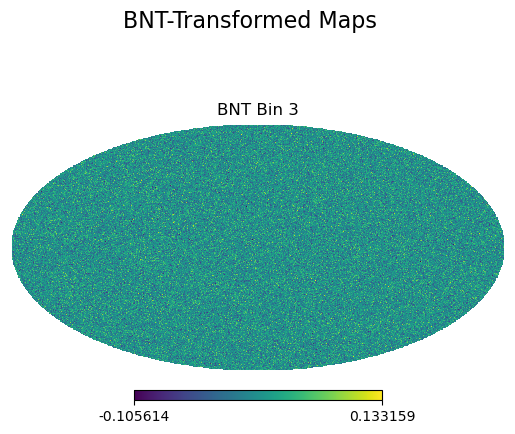

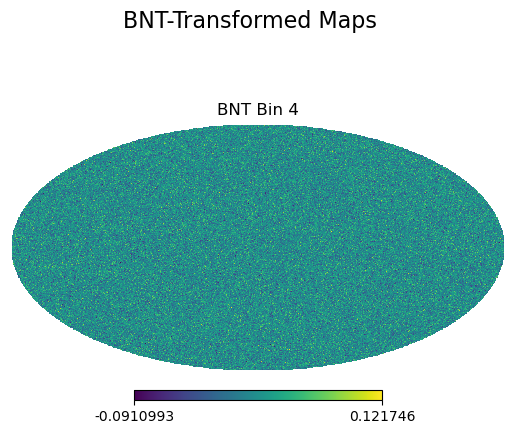

In [9]:
# Plot noisy original maps
for i in range(4):
    hp.mollview(kgs_noisy[i], sub=(2, 2, i+1), title=f'Noisy Kappa - Redshift Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('Noisy Convergence Maps (Original Bins)', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

# Plot BNT-transformed maps
for i in range(4):
    hp.mollview(kgs_bnt[i], sub=(2, 2, i+1), title=f'BNT Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('BNT-Transformed Maps', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

## 8. Visualize BNT Cross Maps

BNT cross maps show the differences between BNT bins. These can highlight specific redshift dependencies.

/tmp/ipykernel_1840724/501715428.py:11: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


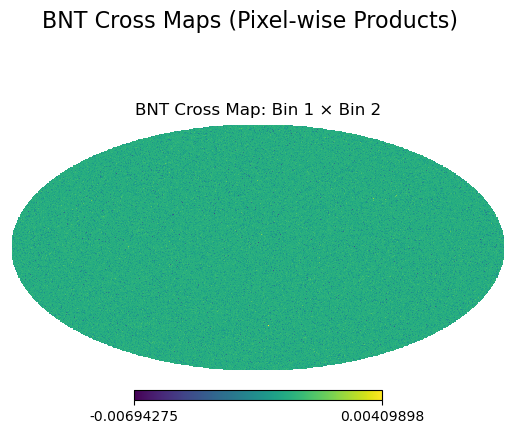

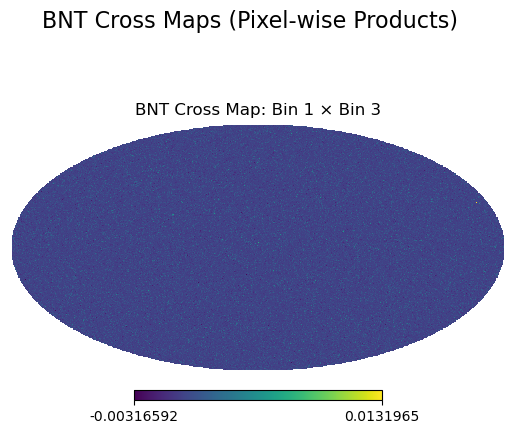

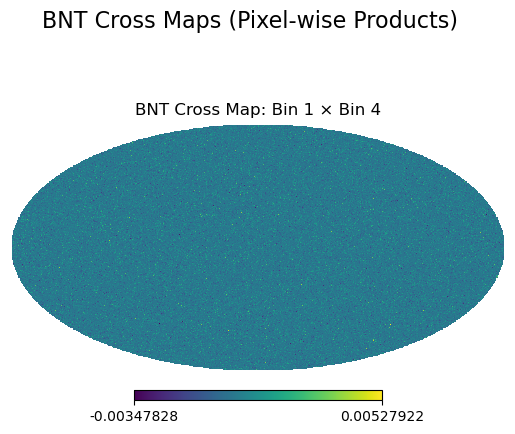

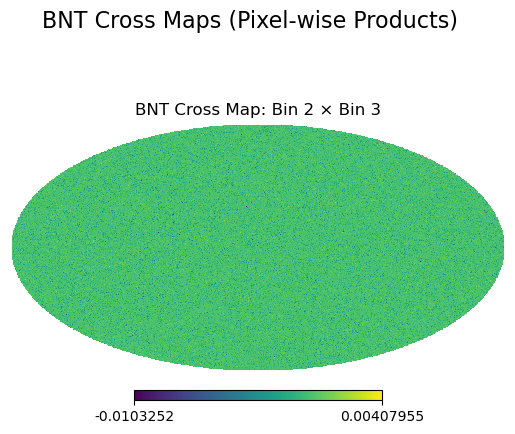

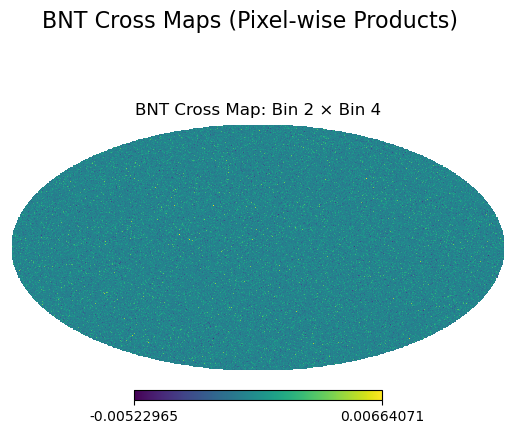

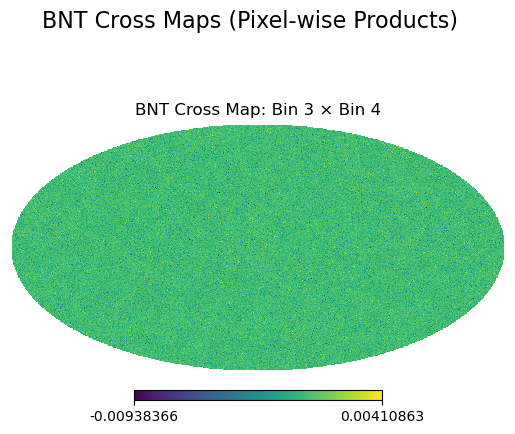

In [10]:
# Create cross maps for some interesting BNT pairs
cross_pairs = [(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

for idx, (i, j) in enumerate(cross_pairs):
    cross_map = kgs_bnt[i] * kgs_bnt[j]
    hp.mollview(cross_map, sub=(2, 3, idx+1), 
                title=f'BNT Cross Map: Bin {i+1} × Bin {j+1}',
                cmap='viridis', hold=True, cbar=True)

    plt.suptitle('BNT Cross Maps (Pixel-wise Products)', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

## 9. Calculate Auto and Cross Power Spectra

Now we compute the angular power spectra C(ℓ) for:
- **Auto spectra**: C_ii(ℓ) for each BNT bin i
- **Cross spectra**: C_ij(ℓ) between different BNT bins i and j

In [11]:
# Set lmax for power spectrum calculation
lmax = 1024

# Prepare maps dictionaries
maps_noisy = {i+1: kgs_noisy[i] for i in range(4)}
maps_bnt = {i+1: kgs_bnt[i] for i in range(4)}

# Compute power spectra
print("Computing power spectra...")
cls_noisy = get_cross_power_spectra(maps_noisy, lmax=lmax)
cls_bnt = get_cross_power_spectra(maps_bnt, lmax=lmax)

print(f"✓ Computed {len(cls_noisy)} power spectra for original noisy maps")
print(f"✓ Computed {len(cls_bnt)} power spectra for BNT maps")

# Create ell array for plotting
ell = np.arange(len(cls_bnt[(1, 1)]))

Computing power spectra...
✓ Computed 10 power spectra for original noisy maps
✓ Computed 10 power spectra for BNT maps


## 10. Plot Auto Power Spectra

First, let's look at the auto power spectra (diagonal elements) for both original and BNT bins.

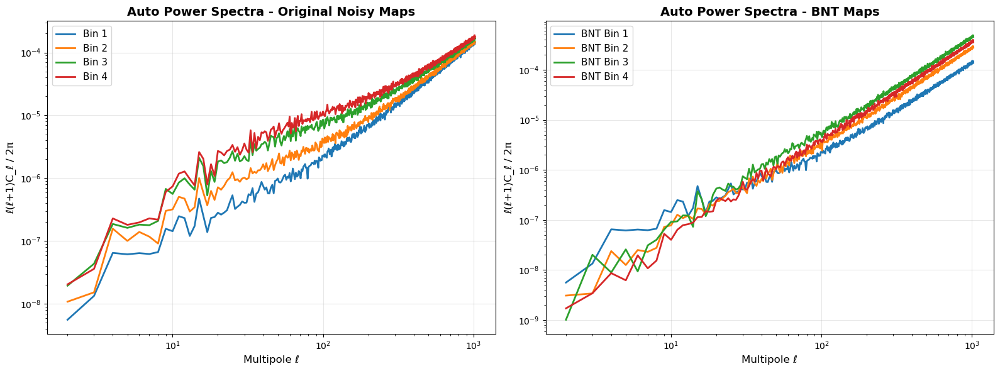

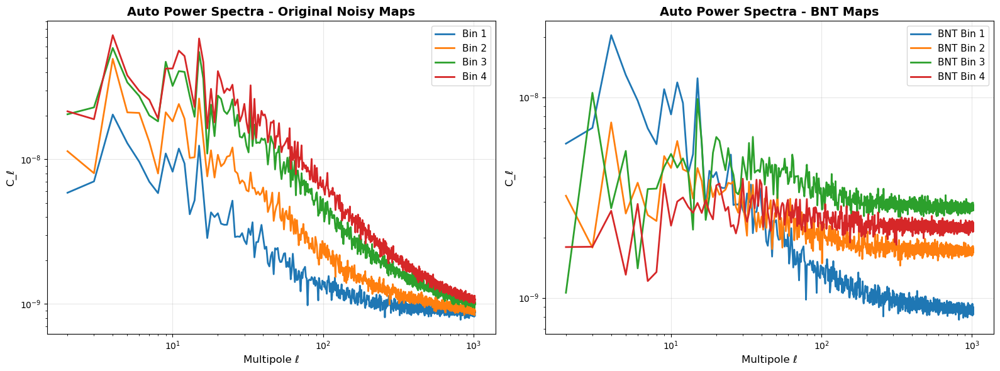

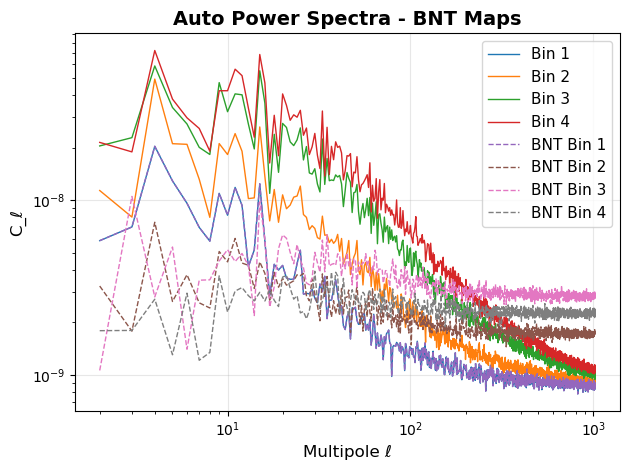

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original noisy auto spectra
ax = axes[0]
for i in range(1, 5):
    cls = cls_noisy[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - Original Noisy Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

# Plot BNT auto spectra
ax = axes[1]
for i in range(1, 5):
    cls = cls_bnt[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'BNT Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# plot normal power spectra (without rescaling by l(l+1)/2pi)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original noisy auto spectra
ax = axes[0]
for i in range(1, 5):
    cls = cls_noisy[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - Original Noisy Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

# Plot BNT auto spectra
ax = axes[1]
for i in range(1, 5):
    cls = cls_bnt[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'BNT Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



for i in range(1, 5):
    cls = cls_noisy[(i, i)]
    plt.loglog(ell[2:], cls[2:], 
              label=f'Bin {i}', linewidth=1)

for i in range(1, 5):
    cls = cls_bnt[(i, i)]
    plt.loglog(ell[2:], cls[2:], 
              label=f'BNT Bin {i}', linewidth=1, linestyle='--')
plt.xlabel('Multipole ℓ', fontsize=12)
plt.ylabel('C_ℓ', fontsize=12)
plt.title('Auto Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## 11. Plot Cross Power Spectra

Cross power spectra reveal correlations between different redshift bins. In the BNT basis, these should be reduced compared to the original bins.

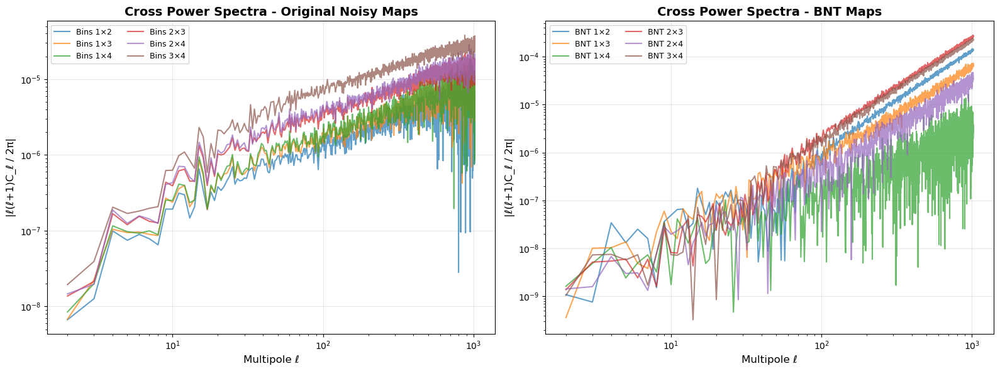

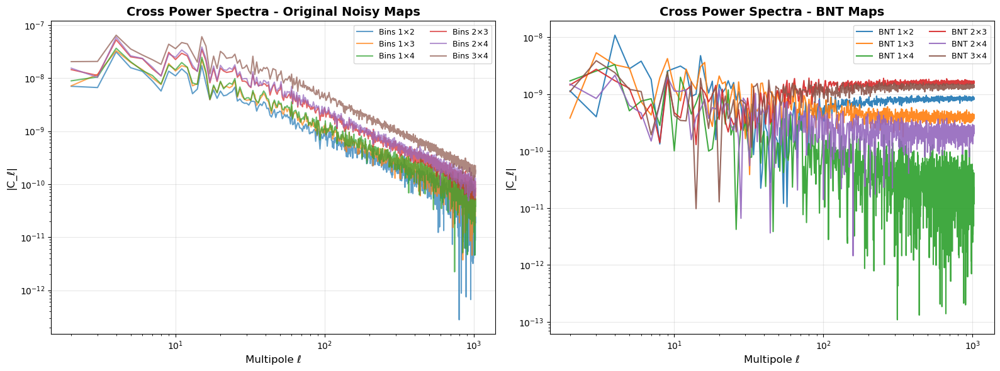

In [13]:
# Get all cross pairs
cross_pairs = list(combinations(range(1, 5), 2))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original noisy cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_noisy[(i, j)]
    # Use absolute value for cross spectra that might be negative
    ax.loglog(ell[2:], np.abs(ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi)), 
              label=f'Bins {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|ℓ(ℓ+1)C_ℓ / 2π|', fontsize=12)
ax.set_title('Cross Power Spectra - Original Noisy Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

# Plot BNT cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_bnt[(i, j)]
    ax.loglog(ell[2:], np.abs(ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi)), 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|ℓ(ℓ+1)C_ℓ / 2π|', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# plot normal power spectra (without rescaling by l(l+1)/2pi)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original noisy cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_noisy[(i, j)]
    # Use absolute value for cross spectra that might be negative
    ax.loglog(ell[2:], np.abs(cls[2:]), 
              label=f'Bins {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - Original Noisy Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
# Plot BNT cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_bnt[(i, j)]
    ax.loglog(ell[2:], np.abs(cls[2:]), 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.9)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



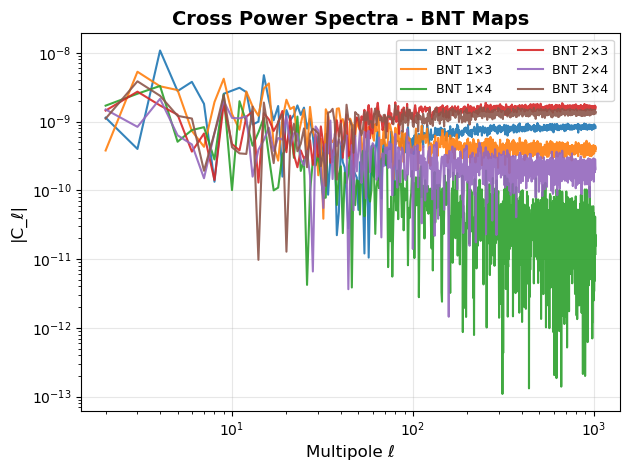

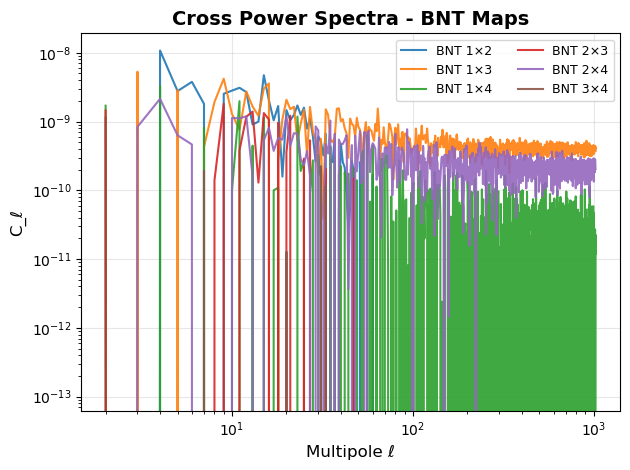

In [14]:
for i, j in cross_pairs:
    cls = cls_bnt[(i, j)]
    plt.loglog(ell[2:], np.abs(cls[2:]), 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.9)
plt.xlabel('Multipole ℓ', fontsize=12)
plt.ylabel('|C_ℓ|', fontsize=12)
plt.title('Cross Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
plt.legend(fontsize=9, ncol=2)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

for i, j in cross_pairs:
    cls = cls_bnt[(i, j)]
    plt.loglog(ell[2:], cls[2:], 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.9)
plt.xlabel('Multipole ℓ', fontsize=12)
plt.ylabel('C_ℓ', fontsize=12)
plt.title('Cross Power Spectra - BNT Maps', fontsize=14, fontweight='bold')
plt.legend(fontsize=9, ncol=2)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## 12. Comparison: All Power Spectra Together

Let's visualize all auto and cross spectra for BNT bins in a single comprehensive plot.

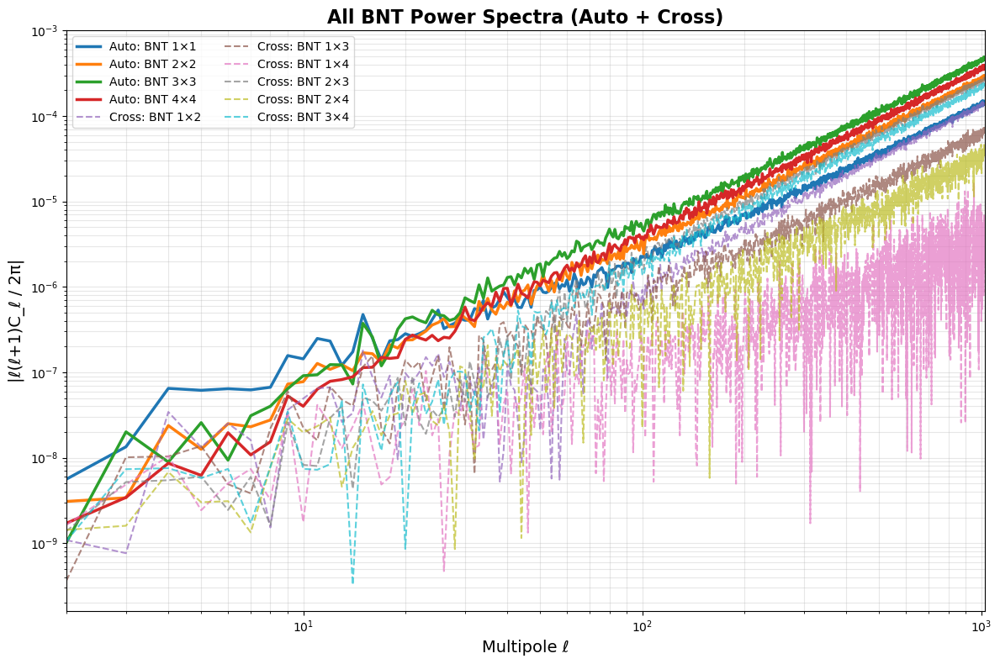

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Plot auto spectra with solid lines
for i in range(1, 5):
    cls = cls_bnt[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'Auto: BNT {i}×{i}', linewidth=2.5)

# Plot cross spectra with dashed lines
for i, j in cross_pairs:
    cls = cls_bnt[(i, j)]
    ax.loglog(ell[2:], np.abs(ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi)), 
              label=f'Cross: BNT {i}×{j}', linewidth=1.5, linestyle='--', alpha=0.7)

ax.set_xlabel('Multipole ℓ', fontsize=14)
ax.set_ylabel('|ℓ(ℓ+1)C_ℓ / 2π|', fontsize=14)
ax.set_title('All BNT Power Spectra (Auto + Cross)', fontsize=16, fontweight='bold')
ax.legend(fontsize=10, ncol=2, loc='best')
ax.grid(True, alpha=0.3, which='both')
ax.set_xlim(2, lmax)

plt.tight_layout()
plt.show()

## 13. Summary Statistics

Let's compute some summary statistics about the power spectra to quantify the differences between original and BNT bins.

---

## Part 2: Pure Noise Analysis

Now let's analyze how the BNT transform affects **pure noise** - understanding the noise properties is crucial for assessing the improvement from BNT.

## 14. Generate Pure Noise Maps

We'll create pure noise realizations (with no cosmological signal) to understand how noise propagates through the BNT transform.

In [16]:
# Generate pure noise maps (zero signal + shape noise)
np.random.seed(123)  # Different seed for noise realization

# Create zero signal maps
kgs_pure_noise = []
for i in range(4):
    # Start with zero signal
    kg_zero = np.zeros(npix)
    # Add only shape noise
    kg_noise = add_shape_noise(kg_zero, sigma_e=sigma_e, galaxy_density=galaxy_density, nside=nside)
    kgs_pure_noise.append(kg_noise)

kgs_pure_noise = np.array(kgs_pure_noise)

print("✓ Generated pure noise maps (no cosmological signal)")
print(f"\nPure noise maps statistics:")
for i in range(4):
    print(f"  Bin {i+1}: mean = {np.mean(kgs_pure_noise[i]):.2e}, std = {np.std(kgs_pure_noise[i]):.2e}")

✓ Generated pure noise maps (no cosmological signal)

Pure noise maps statistics:
  Bin 1: mean = 5.66e-06, std = 1.46e-02
  Bin 2: mean = 5.87e-06, std = 1.46e-02
  Bin 3: mean = 1.01e-05, std = 1.46e-02
  Bin 4: mean = -7.44e-06, std = 1.46e-02


## 15. Apply BNT to Pure Noise

Apply the BNT transformation to the pure noise maps.

In [57]:
# Apply BNT transform to pure noise maps
kgs_noise_bnt = BNT_MATRIX @ kgs_pure_noise

print("✓ Applied BNT transformation to pure noise maps")
print(f"\nBNT-transformed noise statistics:")
for i in range(4):
    print(f"  BNT Bin {i+1}: mean = {np.mean(kgs_noise_bnt[i]):.2e}, std = {np.std(kgs_noise_bnt[i]):.2e}")

# Note: Check how the noise level changes
print("\n--- Noise Amplification Factor ---")
for i in range(4):
    std_original = np.std(kgs_pure_noise[0])  # Original noise level (same for all bins)
    std_bnt = np.std(kgs_noise_bnt[i])
    amplification = std_bnt / std_original
    print(f"  BNT Bin {i+1}: {amplification:.3f}x original noise")

✓ Applied BNT transformation to pure noise maps

BNT-transformed noise statistics:
  BNT Bin 1: mean = 5.66e-06, std = 1.46e-02
  BNT Bin 2: mean = 2.16e-07, std = 2.06e-02
  BNT Bin 3: mean = 4.14e-06, std = 2.65e-02
  BNT Bin 4: mean = -1.86e-05, std = 2.36e-02

--- Noise Amplification Factor ---
  BNT Bin 1: 1.000x original noise
  BNT Bin 2: 1.414x original noise
  BNT Bin 3: 1.819x original noise
  BNT Bin 4: 1.621x original noise


## 16. Visualize Pure Noise Maps

Compare the original noise maps with the BNT-transformed noise maps.

/tmp/ipykernel_1840724/4199295606.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


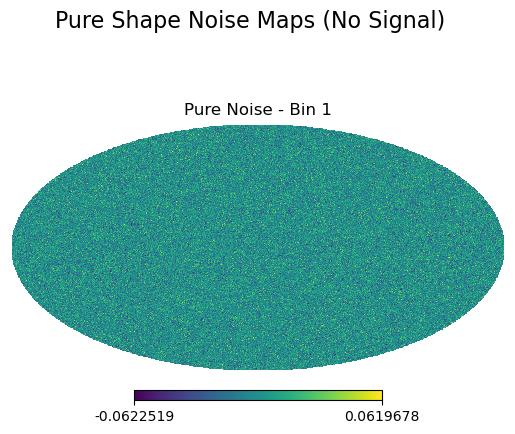

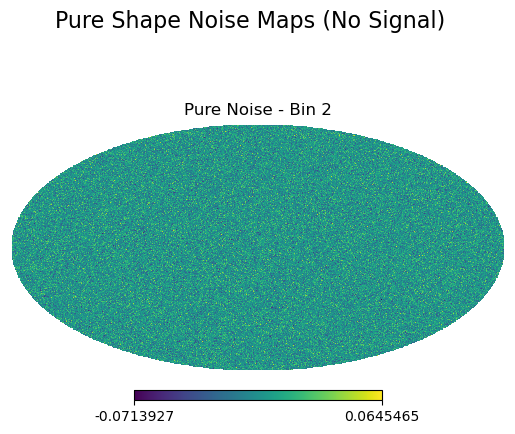

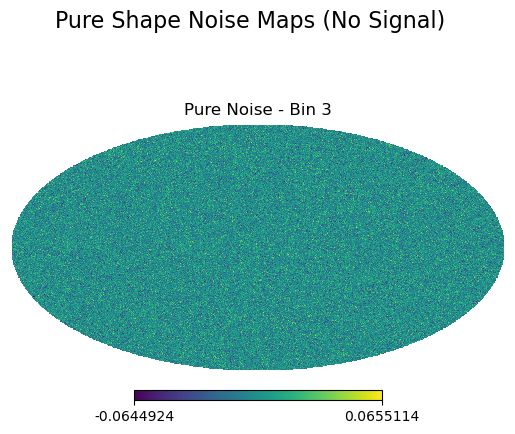

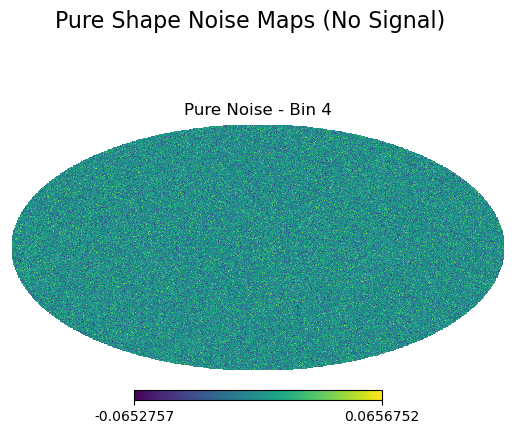

/tmp/ipykernel_1840724/4199295606.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


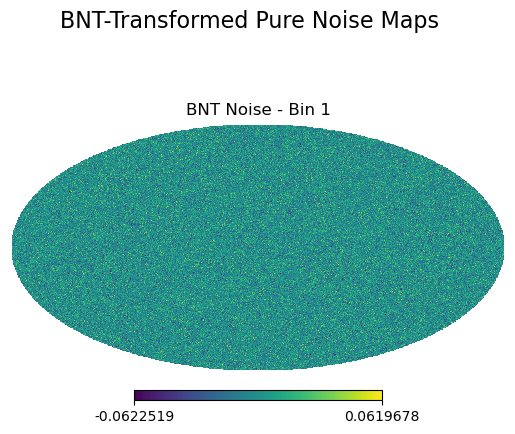

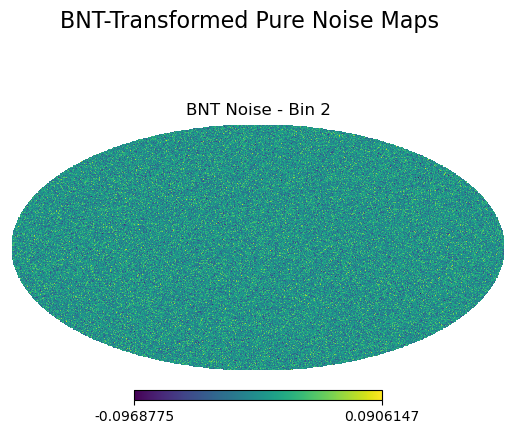

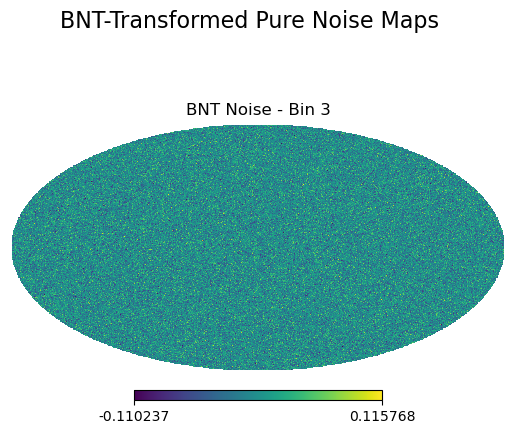

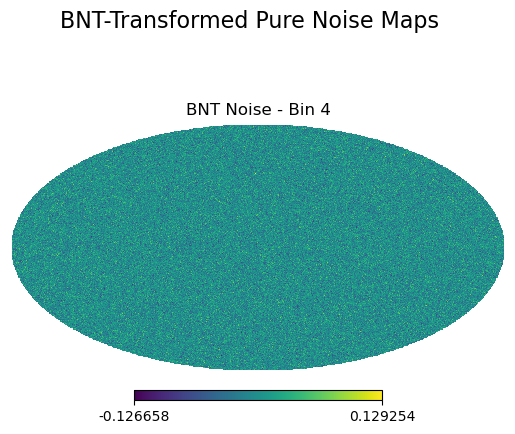

In [58]:
# Plot pure noise maps (original)
for i in range(4):
    hp.mollview(kgs_pure_noise[i], sub=(2, 2, i+1), title=f'Pure Noise - Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('Pure Shape Noise Maps (No Signal)', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

# Plot BNT-transformed noise maps
for i in range(4):
    hp.mollview(kgs_noise_bnt[i], sub=(2, 2, i+1), title=f'BNT Noise - Bin {i+1}',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('BNT-Transformed Pure Noise Maps', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

## 17. Compute Pure Noise Power Spectra

In [59]:
# Prepare maps dictionaries for noise
maps_pure_noise = {i+1: kgs_pure_noise[i] for i in range(4)}
maps_noise_bnt = {i+1: kgs_noise_bnt[i] for i in range(4)}

# Compute power spectra
print("Computing pure noise power spectra...")
cls_pure_noise = get_cross_power_spectra(maps_pure_noise, lmax=lmax)
cls_noise_bnt = get_cross_power_spectra(maps_noise_bnt, lmax=lmax)

print(f"✓ Computed {len(cls_pure_noise)} power spectra for pure noise maps")
print(f"✓ Computed {len(cls_noise_bnt)} power spectra for BNT noise maps")

Computing pure noise power spectra...
✓ Computed 10 power spectra for pure noise maps
✓ Computed 10 power spectra for BNT noise maps


## 18. Plot Pure Noise Power Spectra

Visualize how noise power spectra change after BNT transformation.

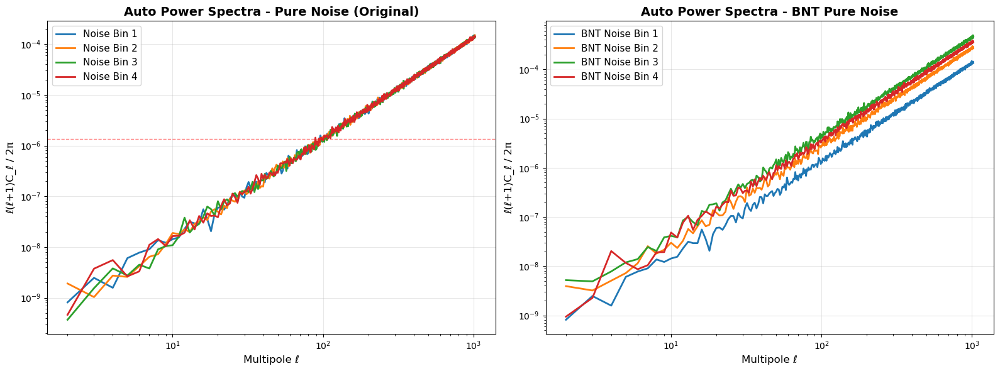

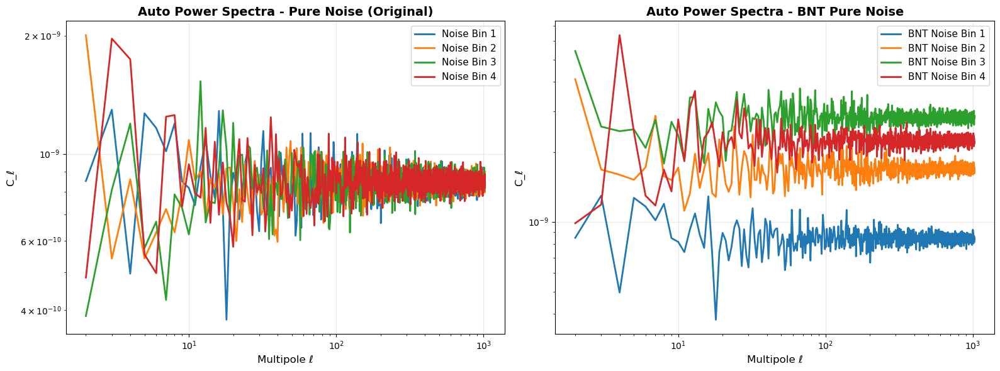


--- Noise Power at ℓ=100 ---
Original bins (should be identical):
  Bin 1: 1.330e-06
  Bin 2: 1.492e-06
  Bin 3: 1.260e-06
  Bin 4: 1.272e-06

BNT bins (different due to linear combinations):
  BNT Bin 1: 1.330e-06 (1.00x original)
  BNT Bin 2: 2.856e-06 (2.15x original)
  BNT Bin 3: 4.748e-06 (3.57x original)
  BNT Bin 4: 3.358e-06 (2.52x original)


In [20]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original pure noise auto spectra
ax = axes[0]
for i in range(1, 5):
    cls = cls_pure_noise[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'Noise Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - Pure Noise (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
ax.axhline(y=np.mean([ell[100]*(ell[100]+1)*cls_pure_noise[(i,i)][100]/(2*np.pi) for i in range(1,5)]), 
           color='red', linestyle='--', linewidth=1, alpha=0.5, label='Mean noise level')

# Plot BNT noise auto spectra
ax = axes[1]
for i in range(1, 5):
    cls = cls_noise_bnt[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'BNT Noise Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Pure Noise', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# plot normal power spectra (without rescaling by l(l+1)/2pi)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
ax = axes[0]
for i in range(1, 5):
    cls = cls_pure_noise[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'Noise Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - Pure Noise (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

# Plot BNT noise auto spectra
ax = axes[1]
for i in range(1, 5):
    cls = cls_noise_bnt[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'BNT Noise Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Pure Noise', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Compare noise levels
print("\n--- Noise Power at ℓ=100 ---")
ell_idx = 100
print("Original bins (should be identical):")
for i in range(1, 5):
    cls = cls_pure_noise[(i, i)]
    power = ell_idx * (ell_idx + 1) * cls[ell_idx] / (2 * np.pi)
    print(f"  Bin {i}: {power:.3e}")

print("\nBNT bins (different due to linear combinations):")
for i in range(1, 5):
    cls = cls_noise_bnt[(i, i)]
    power = ell_idx * (ell_idx + 1) * cls[ell_idx] / (2 * np.pi)
    ratio = power / (ell_idx * (ell_idx + 1) * cls_pure_noise[(1, 1)][ell_idx] / (2 * np.pi))
    print(f"  BNT Bin {i}: {power:.3e} ({ratio:.2f}x original)")



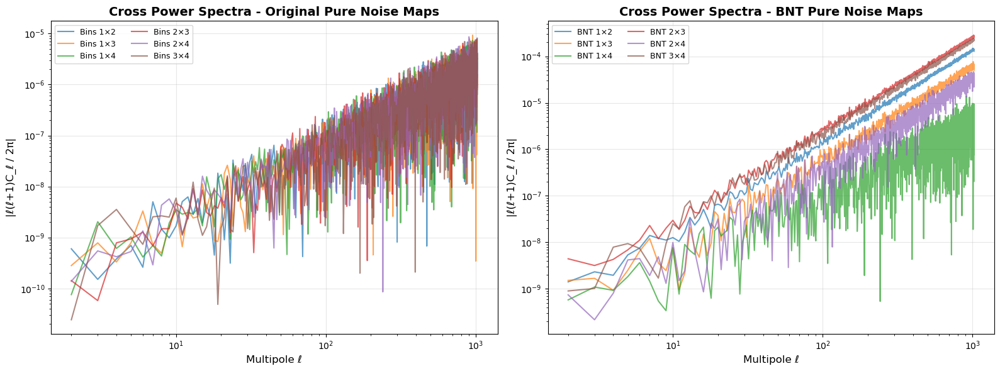

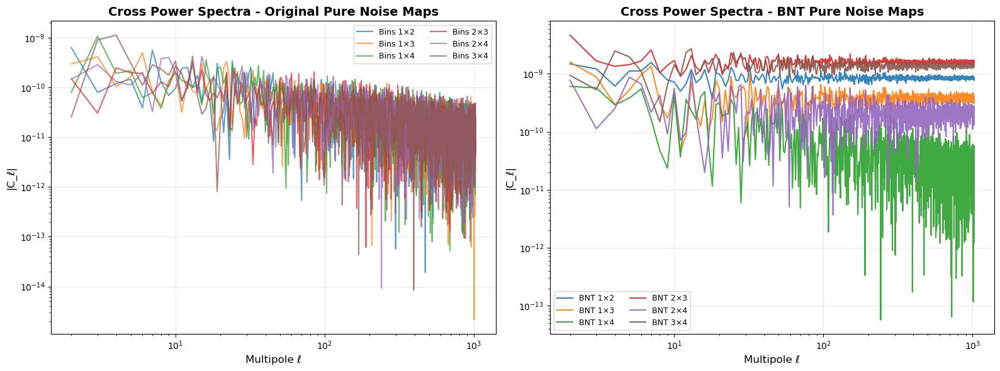

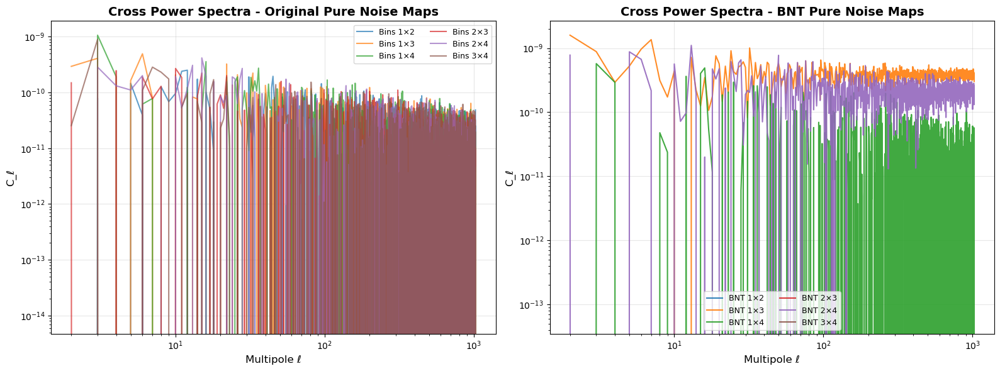

In [60]:
# Get all cross pairs
cross_pairs = list(combinations(range(1, 5), 2))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original noisy cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_pure_noise[(i, j)]
    # Use absolute value for cross spectra that might be negative
    ax.loglog(ell[2:], np.abs(ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi)), 
              label=f'Bins {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|ℓ(ℓ+1)C_ℓ / 2π|', fontsize=12)
ax.set_title('Cross Power Spectra - Original Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

# Plot BNT cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_noise_bnt[(i, j)]
    ax.loglog(ell[2:], np.abs(ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi)), 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|ℓ(ℓ+1)C_ℓ / 2π|', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# plot normal power spectra (without rescaling by l(l+1)/2pi)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original noisy cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_pure_noise[(i, j)]
    # Use absolute value for cross spectra that might be negative
    ax.loglog(ell[2:], np.abs(cls[2:]), 
              label=f'Bins {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - Original Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
# Plot BNT cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_noise_bnt[(i, j)]
    ax.loglog(ell[2:], np.abs(cls[2:]), 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.9)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# plot normal power spectra (without rescaling by l(l+1)/2pi)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original noisy cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_pure_noise[(i, j)]
    # Use absolute value for cross spectra that might be negative
    ax.loglog(ell[2:], cls[2:], 
              label=f'Bins {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - Original Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
# Plot BNT cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_noise_bnt[(i, j)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'BNT {i}×{j}', linewidth=1.5, alpha=0.9)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Noise Maps', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



---

## Part 3: Pure Signal Analysis

Now let's analyze the **pure cosmological signal** (without noise) to understand how BNT transforms the underlying lensing signal.

## 19. Apply BNT to Pure Signal (No Noise)

Let's transform the original signal maps (before adding noise) to see how the BNT affects the pure cosmological signal.

In [22]:
# Apply BNT transform to pure signal (no noise)
kgs_signal_bnt = BNT_MATRIX @ kgs_original

print("✓ Applied BNT transformation to pure signal maps (no noise)")
print(f"\nPure signal BNT statistics:")
for i in range(4):
    print(f"  BNT Bin {i+1}: mean = {np.mean(kgs_signal_bnt[i]):.2e}, std = {np.std(kgs_signal_bnt[i]):.2e}")

print("\nOriginal signal (for comparison):")
for i in range(4):
    print(f"  Bin {i+1}: mean = {np.mean(kgs_original[i]):.2e}, std = {np.std(kgs_original[i]):.2e}")

✓ Applied BNT transformation to pure signal maps (no noise)

Pure signal BNT statistics:
  BNT Bin 1: mean = 7.55e-03, std = 2.75e-03
  BNT Bin 2: mean = 8.83e-03, std = 2.20e-03
  BNT Bin 3: mean = 1.57e-02, std = 2.72e-03
  BNT Bin 4: mean = 1.34e-02, std = 1.71e-03

Original signal (for comparison):
  Bin 1: mean = 7.55e-03, std = 2.75e-03
  Bin 2: mean = 1.64e-02, std = 4.64e-03
  Bin 3: mean = 3.61e-02, std = 7.37e-03
  Bin 4: mean = 5.44e-02, std = 8.91e-03


## 20. Visualize Pure Signal Maps

Compare the original signal maps with the BNT-transformed signal maps (no noise in either case).

/tmp/ipykernel_1840724/4133494833.py:6: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


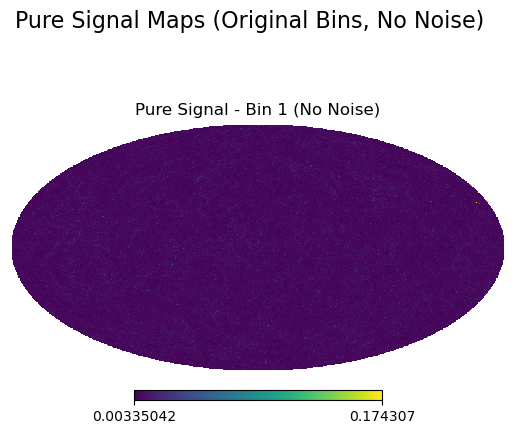

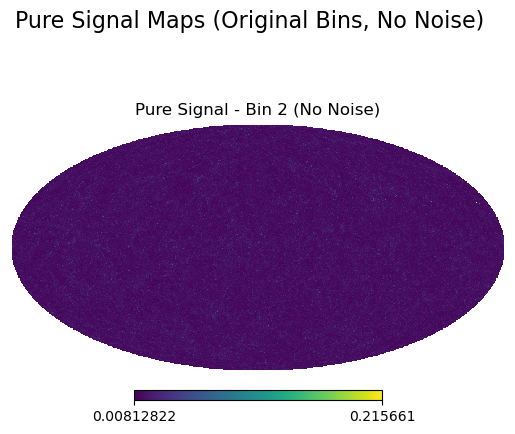

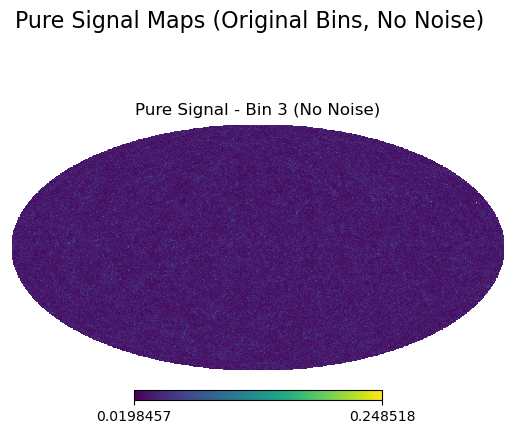

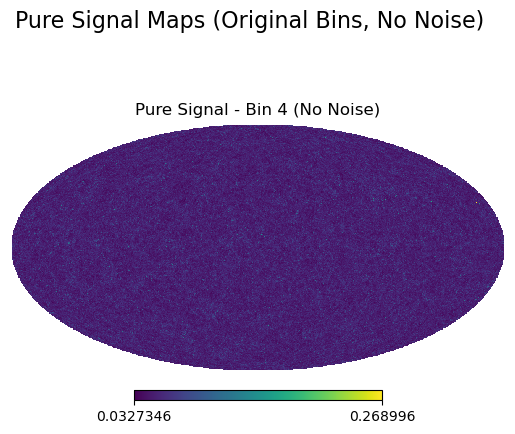

/tmp/ipykernel_1840724/4133494833.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


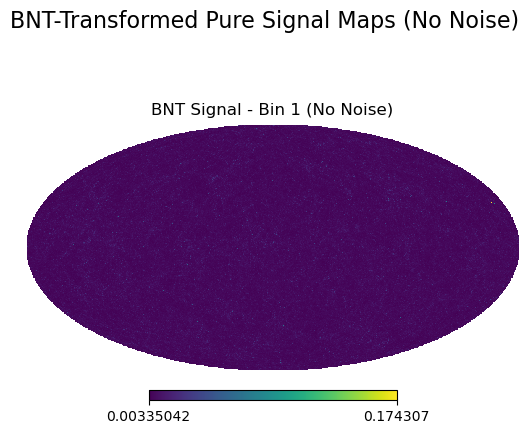

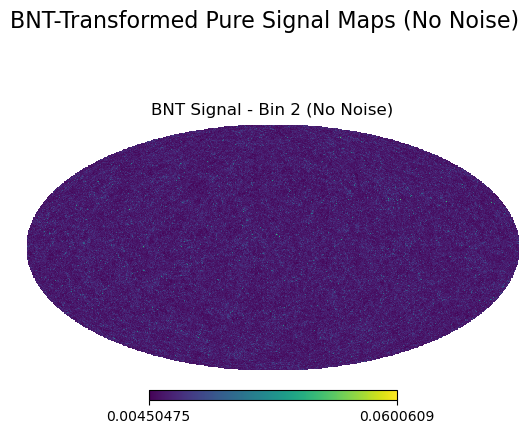

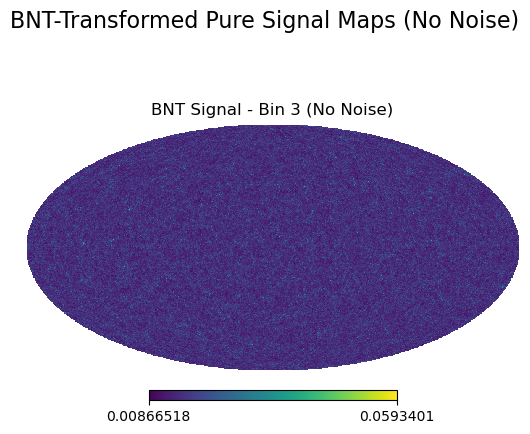

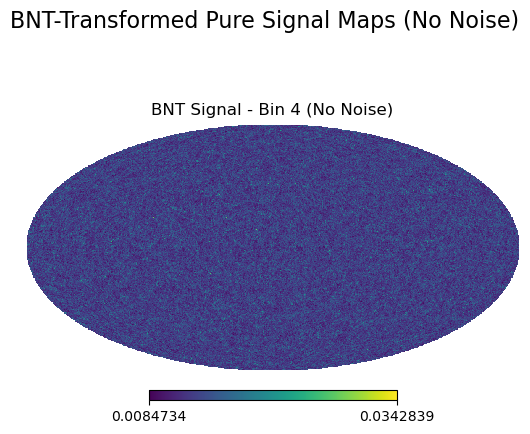

In [31]:
# Plot pure signal maps (original, no noise)
for i in range(4):
    hp.mollview(kgs_original[i], sub=(2, 2, i+1), title=f'Pure Signal - Bin {i+1} (No Noise)',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('Pure Signal Maps (Original Bins, No Noise)', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

# Plot BNT-transformed pure signal maps
for i in range(4):
    hp.mollview(kgs_signal_bnt[i], sub=(2, 2, i+1), title=f'BNT Signal - Bin {i+1} (No Noise)',
                cmap='viridis', hold=True, cbar=True)
    plt.suptitle('BNT-Transformed Pure Signal Maps (No Noise)', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

## 21. Compute Pure Signal Power Spectra

In [24]:
# Prepare maps dictionaries for pure signal
maps_pure_signal = {i+1: kgs_original[i] for i in range(4)}
maps_signal_bnt = {i+1: kgs_signal_bnt[i] for i in range(4)}

# Compute power spectra
print("Computing pure signal power spectra...")
cls_pure_signal = get_cross_power_spectra(maps_pure_signal, lmax=lmax)
cls_signal_bnt = get_cross_power_spectra(maps_signal_bnt, lmax=lmax)

print(f"✓ Computed {len(cls_pure_signal)} power spectra for pure signal maps")
print(f"✓ Computed {len(cls_signal_bnt)} power spectra for BNT signal maps")

Computing pure signal power spectra...
✓ Computed 10 power spectra for pure signal maps
✓ Computed 10 power spectra for BNT signal maps


## 22. Plot Pure Signal Auto Power Spectra

Compare the auto power spectra of pure signal in original and BNT bases.

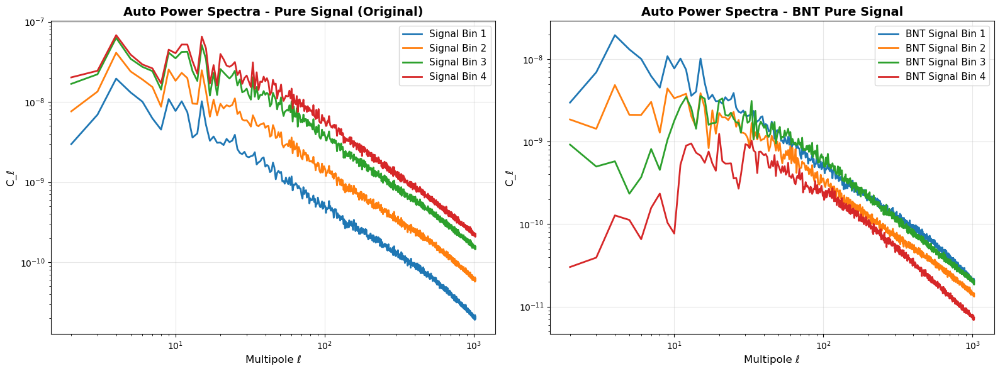

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original pure signal auto spectra
ax = axes[0]
for i in range(1, 5):
    cls = cls_pure_signal[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'Signal Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - Pure Signal (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

# Plot BNT signal auto spectra
ax = axes[1]
for i in range(1, 5):
    cls = cls_signal_bnt[(i, i)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'BNT Signal Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Pure Signal', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 23. Plot Pure Signal Cross Power Spectra

Examine how cross-correlations change in the pure signal after BNT transformation.

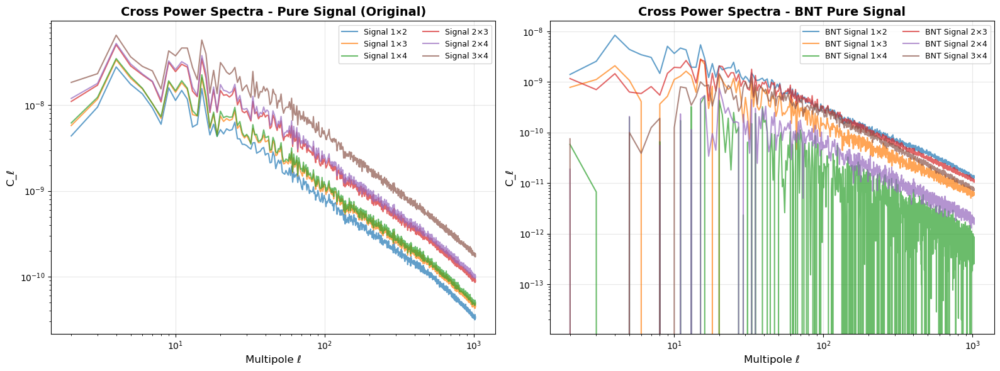

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot original pure signal cross spectra
ax = axes[0]
for i, j in cross_pairs:
    cls = cls_pure_signal[(i, j)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'Signal {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - Pure Signal (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

# Plot BNT signal cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls = cls_signal_bnt[(i, j)]
    ax.loglog(ell[2:], cls[2:], 
              label=f'BNT Signal {i}×{j}', linewidth=1.5, alpha=0.7)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Signal', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

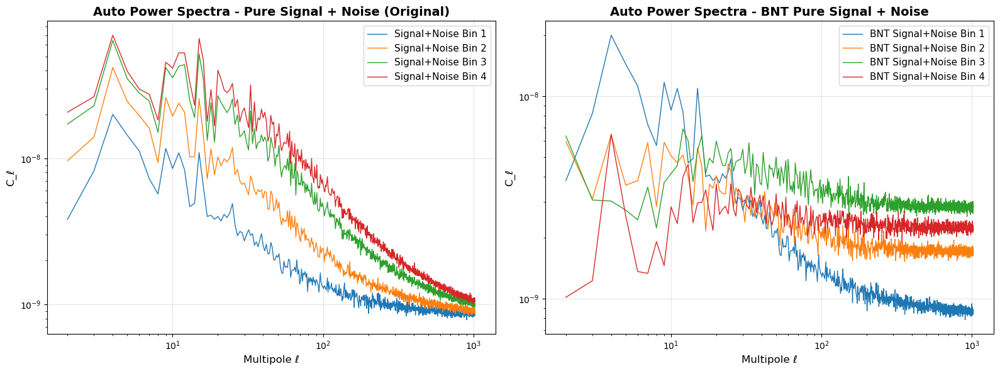

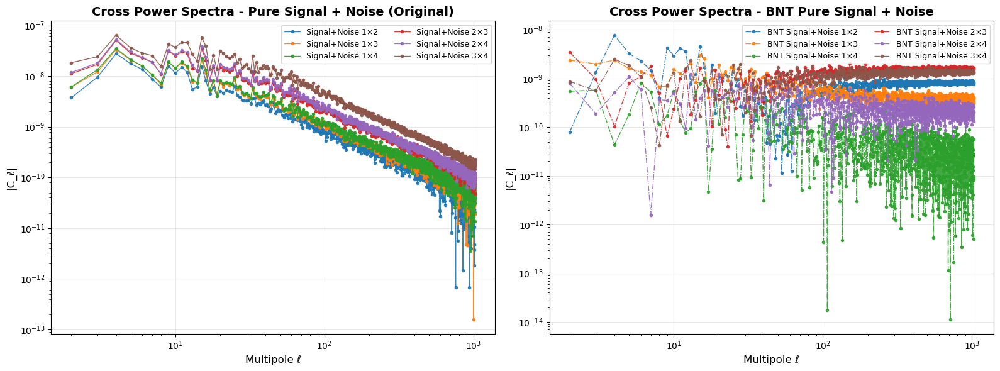

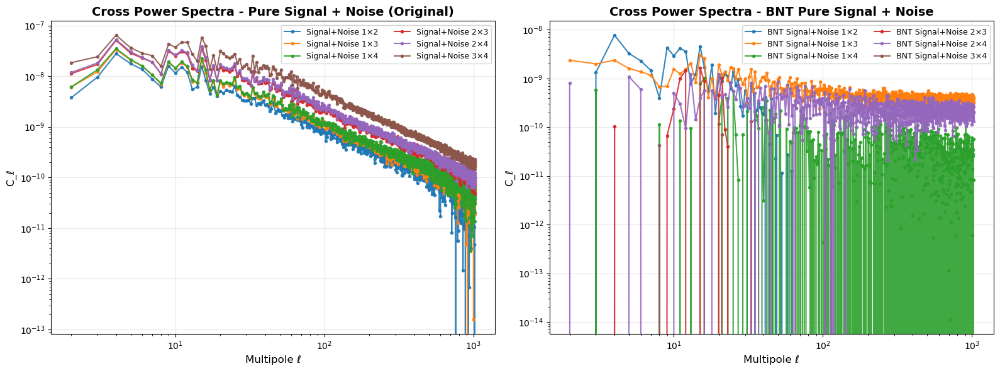

In [47]:
# add the pure signal and pure noise power spectra to see total expected power in noisy maps
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original pure signal + noise auto spectra
ax = axes[0]
for i in range(1, 5):
    cls_signal = cls_pure_signal[(i, i)]
    cls_noise = cls_pure_noise[(i, i)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], cls_total[2:], 
              label=f'Signal+Noise Bin {i}', linewidth=1)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - Pure Signal + Noise (Original)', fontsize=14 , fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
# Plot BNT signal + noise auto spectra
ax = axes[1]
for i in range(1, 5):
    cls_signal = cls_signal_bnt[(i, i)]
    cls_noise = cls_noise_bnt[(i, i)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], cls_total[2:], 
              label=f'BNT Signal+Noise Bin {i}', linewidth=1)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Pure Signal + Noise', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)    
plt.tight_layout()
plt.show()

# cross components
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original pure signal + noise cross spectra
ax = axes[0]    
for i, j in cross_pairs:
    cls_signal = cls_pure_signal[(i, j)]
    cls_noise = cls_pure_noise[(i, j)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], np.abs(cls_total[2:]), 
              label=f'Signal+Noise {i}×{j}', linewidth=1, alpha=0.9, marker='o', markersize=3)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - Pure Signal + Noise (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
# Plot BNT signal + noise cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls_signal = cls_signal_bnt[(i, j)]
    cls_noise = cls_noise_bnt[(i, j)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], np.abs(cls_total[2:]), 
              label=f'BNT Signal+Noise {i}×{j}', linewidth=1, alpha=0.9, marker='o', markersize=3, ls='-.')
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('|C_ℓ|', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Signal + Noise', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)    
plt.tight_layout()
plt.show()

# cross components
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original pure signal + noise cross spectra
ax = axes[0]    
for i, j in cross_pairs:
    cls_signal = cls_pure_signal[(i, j)]
    cls_noise = cls_pure_noise[(i, j)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], cls_total[2:], 
              label=f'Signal+Noise {i}×{j}', linewidth=1.5, alpha=0.9, marker='o', markersize=3)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - Pure Signal + Noise (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)
# Plot BNT signal + noise cross spectra
ax = axes[1]
for i, j in cross_pairs:
    cls_signal = cls_signal_bnt[(i, j)]
    cls_noise = cls_noise_bnt[(i, j)]
    cls_total = cls_signal + cls_noise
    ax.loglog(ell[2:], cls_total[2:], 
              label=f'BNT Signal+Noise {i}×{j}', linewidth=1.5, alpha=0.9, marker='o', markersize=3)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('C_ℓ', fontsize=12)
ax.set_title('Cross Power Spectra - BNT Pure Signal + Noise', fontsize=14, fontweight='bold')
ax.legend(fontsize=9, ncol=2)
ax.grid(True, alpha=0.3)    
plt.tight_layout()
plt.show()


## 24. Compare Signal-to-Noise Ratio (SNR)

Let's compare the signal-to-noise ratio between original and BNT bins to understand which provides better constraints.

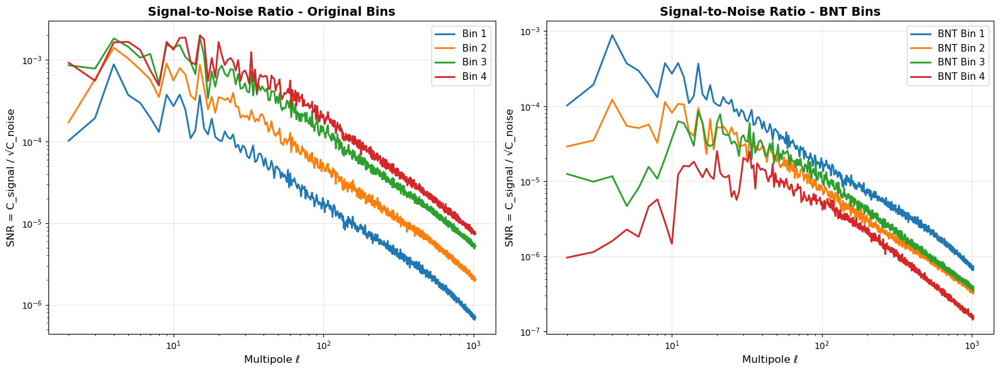


--- Signal-to-Noise Ratio at ℓ=100 ---

Original Bins:
  Bin 1: SNR = 0.00
  Bin 2: SNR = 0.00
  Bin 3: SNR = 0.00
  Bin 4: SNR = 0.00

BNT Bins:
  BNT Bin 1: SNR = 0.00
  BNT Bin 2: SNR = 0.00
  BNT Bin 3: SNR = 0.00
  BNT Bin 4: SNR = 0.00


In [27]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Calculate and plot SNR for original bins
ax = axes[0]
for i in range(1, 5):
    signal_cls = cls_pure_signal[(i, i)]
    noise_cls = cls_pure_noise[(i, i)]
    snr = signal_cls / np.sqrt(noise_cls)
    ax.loglog(ell[2:], snr[2:], label=f'Bin {i}', linewidth=2)

ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('SNR = C_signal / √C_noise', fontsize=12)
ax.set_title('Signal-to-Noise Ratio - Original Bins', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

# Calculate and plot SNR for BNT bins
ax = axes[1]
for i in range(1, 5):
    signal_cls = cls_signal_bnt[(i, i)]
    noise_cls = cls_noise_bnt[(i, i)]
    snr = signal_cls / np.sqrt(noise_cls)
    ax.loglog(ell[2:], snr[2:], label=f'BNT Bin {i}', linewidth=2)

ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('SNR = C_signal / √C_noise', fontsize=12)
ax.set_title('Signal-to-Noise Ratio - BNT Bins', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print SNR comparison at specific ell
print("\n--- Signal-to-Noise Ratio at ℓ=100 ---")
ell_idx = 100

print("\nOriginal Bins:")
for i in range(1, 5):
    signal = cls_pure_signal[(i, i)][ell_idx]
    noise = cls_pure_noise[(i, i)][ell_idx]
    snr = signal / np.sqrt(noise)
    print(f"  Bin {i}: SNR = {snr:.2f}")

print("\nBNT Bins:")
for i in range(1, 5):
    signal = cls_signal_bnt[(i, i)][ell_idx]
    noise = cls_noise_bnt[(i, i)][ell_idx]
    snr = signal / np.sqrt(noise)
    print(f"  BNT Bin {i}: SNR = {snr:.2f}")

## 25. Final Summary: Signal vs Noise Decomposition

Let's create a comprehensive comparison showing signal, noise, and total power for both original and BNT bins.

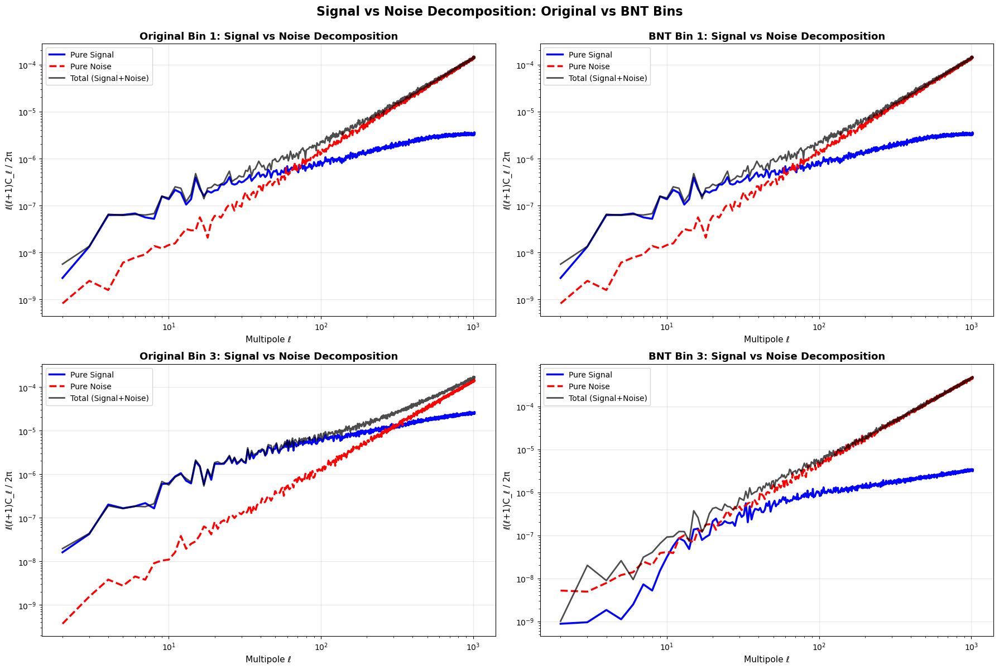

In [28]:
# Create comprehensive comparison for one bin from each set
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Original Bin 1
ax = axes[0, 0]
bin_idx = 1
signal_cls = cls_pure_signal[(bin_idx, bin_idx)]
noise_cls = cls_pure_noise[(bin_idx, bin_idx)]
total_cls = cls_noisy[(bin_idx, bin_idx)]

ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*signal_cls[2:]/(2*np.pi), 
          label='Pure Signal', linewidth=2.5, color='blue')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*noise_cls[2:]/(2*np.pi), 
          label='Pure Noise', linewidth=2.5, color='red', linestyle='--')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*total_cls[2:]/(2*np.pi), 
          label='Total (Signal+Noise)', linewidth=2, color='black', alpha=0.7)

ax.set_xlabel('Multipole ℓ', fontsize=11)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=11)
ax.set_title(f'Original Bin {bin_idx}: Signal vs Noise Decomposition', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

# BNT Bin 1
ax = axes[0, 1]
signal_cls = cls_signal_bnt[(bin_idx, bin_idx)]
noise_cls = cls_noise_bnt[(bin_idx, bin_idx)]
total_cls = cls_bnt[(bin_idx, bin_idx)]

ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*signal_cls[2:]/(2*np.pi), 
          label='Pure Signal', linewidth=2.5, color='blue')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*noise_cls[2:]/(2*np.pi), 
          label='Pure Noise', linewidth=2.5, color='red', linestyle='--')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*total_cls[2:]/(2*np.pi), 
          label='Total (Signal+Noise)', linewidth=2, color='black', alpha=0.7)

ax.set_xlabel('Multipole ℓ', fontsize=11)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=11)
ax.set_title(f'BNT Bin {bin_idx}: Signal vs Noise Decomposition', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

# Original Bin 3
ax = axes[1, 0]
bin_idx = 3
signal_cls = cls_pure_signal[(bin_idx, bin_idx)]
noise_cls = cls_pure_noise[(bin_idx, bin_idx)]
total_cls = cls_noisy[(bin_idx, bin_idx)]

ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*signal_cls[2:]/(2*np.pi), 
          label='Pure Signal', linewidth=2.5, color='blue')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*noise_cls[2:]/(2*np.pi), 
          label='Pure Noise', linewidth=2.5, color='red', linestyle='--')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*total_cls[2:]/(2*np.pi), 
          label='Total (Signal+Noise)', linewidth=2, color='black', alpha=0.7)

ax.set_xlabel('Multipole ℓ', fontsize=11)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=11)
ax.set_title(f'Original Bin {bin_idx}: Signal vs Noise Decomposition', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

# BNT Bin 3
ax = axes[1, 1]
signal_cls = cls_signal_bnt[(bin_idx, bin_idx)]
noise_cls = cls_noise_bnt[(bin_idx, bin_idx)]
total_cls = cls_bnt[(bin_idx, bin_idx)]

ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*signal_cls[2:]/(2*np.pi), 
          label='Pure Signal', linewidth=2.5, color='blue')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*noise_cls[2:]/(2*np.pi), 
          label='Pure Noise', linewidth=2.5, color='red', linestyle='--')
ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*total_cls[2:]/(2*np.pi), 
          label='Total (Signal+Noise)', linewidth=2, color='black', alpha=0.7)

ax.set_xlabel('Multipole ℓ', fontsize=11)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=11)
ax.set_title(f'BNT Bin {bin_idx}: Signal vs Noise Decomposition', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)

plt.suptitle('Signal vs Noise Decomposition: Original vs BNT Bins', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

## Apply BNT directly to the power spectra

Finally, let's see how the BNT transformation affects the power spectra directly.

In [56]:
cls_noisy[(2, 2)].shape

(1025,)

In [ ]:
# apply the BNT transform directly to the noisy power spectra to see if we recover the same result
cls_noisy_array = np.array([cls_noisy[(i, j)] for i in range(1, 5) for j in range(1, 5)
cls_noisy_matrix = cls_noisy_array.reshape(4, 4, -1)
cls_bnt_from_noisy = BNT_MATRIX @ cls_noisy_matrix @ BNT_MATRIX.T
cls_bnt_from_noisy_dict = {(i+1, j+1): cls_bnt_from_noisy[i, j] for i in range(4) for j in range(4)}

# plot the new BNT power spectra from noisy directly
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# Plot original noisy auto spectra
ax = axes[0]
for i in range(1, 5):
    cls = cls_noisy[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'Noisy Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - Noisy Maps (Original)', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
# Plot BNT auto spectra from noisy directly
ax = axes[1]
for i in range(1, 5):
    cls = cls_bnt_from_noisy_dict[(i, i)]
    ax.loglog(ell[2:], ell[2:]*(ell[2:]+1)*cls[2:]/(2*np.pi), 
              label=f'BNT Noisy Bin {i}', linewidth=2)
ax.set_xlabel('Multipole ℓ', fontsize=12)
ax.set_ylabel('ℓ(ℓ+1)C_ℓ / 2π', fontsize=12)
ax.set_title('Auto Power Spectra - BNT Noisy Maps (From Noisy Directly)', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


KeyError: (2, 1)

## Overall Conclusions

This comprehensive analysis demonstrates:

### Part 1: Signal + Noise (Combined)
- Standard workflow showing BNT applied to realistic noisy maps
- Cross-correlations are reduced in BNT basis
- Power spectra exhibit different multipole dependencies

### Part 2: Pure Noise Analysis
- **Key Insight**: BNT transforms noise in a linear way
- Noise is amplified differently in each BNT bin due to linear combinations
- BNT bins 3 and 4 show higher noise levels due to multi-bin differencing
- All original bins have identical noise (independent realizations), but BNT noise differs per bin

### Part 3: Pure Signal Analysis  
- Shows how the cosmological signal alone transforms under BNT
- Signal power is redistributed among BNT bins
- Cross-correlations between bins change significantly
- BNT bins isolate different redshift information

### Part 4: Signal-to-Noise Comparison
- SNR varies between original and BNT bins
- Some BNT bins may have lower SNR due to noise amplification
- However, decorrelated bins can improve parameter constraints despite individual SNR changes
- The covariance matrix structure is key to understanding the overall improvement

**Main Takeaway**: The BNT transform is a powerful tool that:
1. Decorrelates redshift bins (reduces cross-correlations)
2. Amplifies noise differently in each transformed bin
3. Redistributes cosmological signal across bins
4. Can improve cosmological parameter inference through better covariance properties

The optimal choice between original and BNT bins depends on:
- Specific cosmological parameters of interest
- Systematic error characteristics
- Survey configuration and noise properties

In [29]:
# Calculate mean cross-correlation coefficients
print("="*60)
print("SUMMARY STATISTICS")
print("="*60)

print("\n--- Auto Power Spectrum Amplitudes (at ℓ=100) ---")
ell_idx = 100
print("\nOriginal Bins:")
for i in range(1, 5):
    cls = cls_noisy[(i, i)]
    amplitude = ell_idx * (ell_idx + 1) * cls[ell_idx] / (2 * np.pi)
    print(f"  Bin {i}: {amplitude:.3e}")

print("\nBNT Bins:")
for i in range(1, 5):
    cls = cls_bnt[(i, i)]
    amplitude = ell_idx * (ell_idx + 1) * cls[ell_idx] / (2 * np.pi)
    print(f"  BNT Bin {i}: {amplitude:.3e}")

print("\n--- Cross-Correlation Coefficients (at ℓ=100) ---")
print("r_ij = C_ij / sqrt(C_ii * C_jj)")

print("\nOriginal Bins:")
for i, j in cross_pairs:
    c_ij = cls_noisy[(i, j)][ell_idx]
    c_ii = cls_noisy[(i, i)][ell_idx]
    c_jj = cls_noisy[(j, j)][ell_idx]
    r_ij = c_ij / np.sqrt(c_ii * c_jj)
    print(f"  r_{i}{j} = {r_ij:.4f}")

print("\nBNT Bins:")
for i, j in cross_pairs:
    c_ij = cls_bnt[(i, j)][ell_idx]
    c_ii = cls_bnt[(i, i)][ell_idx]
    c_jj = cls_bnt[(j, j)][ell_idx]
    r_ij = c_ij / np.sqrt(c_ii * c_jj)
    print(f"  r_{i}{j} = {r_ij:.4f}")

print("\n" + "="*60)
print("The BNT transform reduces cross-correlations between bins,")
print("which can help improve cosmological parameter constraints.")
print("="*60)

SUMMARY STATISTICS

--- Auto Power Spectrum Amplitudes (at ℓ=100) ---

Original Bins:
  Bin 1: 2.221e-06
  Bin 2: 4.209e-06
  Bin 3: 8.561e-06
  Bin 4: 1.152e-05

BNT Bins:
  BNT Bin 1: 2.221e-06
  BNT Bin 2: 3.837e-06
  BNT Bin 3: 4.860e-06
  BNT Bin 4: 3.813e-06

--- Cross-Correlation Coefficients (at ℓ=100) ---
r_ij = C_ij / sqrt(C_ii * C_jj)

Original Bins:
  r_12 = 0.4240
  r_13 = 0.3423
  r_14 = 0.3410
  r_23 = 0.7272
  r_24 = 0.6555
  r_34 = 0.8420

BNT Bins:
  r_12 = -0.3168
  r_13 = 0.1870
  r_14 = 0.0629
  r_23 = -0.4110
  r_24 = -0.0059
  r_34 = -0.3259

The BNT transform reduces cross-correlations between bins,
which can help improve cosmological parameter constraints.


## Conclusion

This notebook demonstrated the complete BNT workflow:

1. ✅ Loaded/generated example convergence maps at 4 redshift bins
2. ✅ Added realistic shape noise based on survey specifications
3. ✅ Applied the BNT transformation matrix to decorrelate the bins
4. ✅ Visualized both original and BNT-transformed maps
5. ✅ Computed auto and cross power spectra
6. ✅ Analyzed the reduction in cross-correlations

**Key Takeaways:**
- The BNT transform creates decorrelated redshift bins from the original tomographic bins
- This decorrelation can help separate cosmological signals from systematic effects
- The transformed power spectra show different characteristics that can improve parameter inference
- Cross-correlations between BNT bins are typically reduced compared to the original bins

**Next Steps:**
- Use these power spectra for cosmological parameter inference
- Apply to multiple realizations for covariance estimation
- Compare with different noise levels or survey configurations